In [2]:
from torch.utils.data import DataLoader, Subset
import random
import torch
import figure_names
from eigenestimation.evaluation.top_logits import compute_jacobian
from importlib import reload
# reload compute jacobiab
import sys
import torchvision.transforms as transforms
import torch
import torchvision
from eigenestimation.evaluation.top_logits import compute_jacobian
from eigenestimation.evaluation.top_images import compute_circuit_vals

from eigenestimation.toy_models.cnn_wrapper import ImageOnlyDataset
import gc
import torch
from tqdm import tqdm
import figure_names
checkpoints_path = "/root/eigenestimation/outputs/eigenmodels/"
eigenmodel_path = checkpoints_path + "mobilenet-v3-eigenmodel.pt"
eigenmodel = torch.load(eigenmodel_path)['model']

circuit_vals = torch.load(checkpoints_path + "mobilenet-v3-eigenmodel-circuit_attributions.pt")
X_ordered = torch.load(checkpoints_path + "mobilenet-v3-eigenmodel-X_data.pt")
frac_activated = torch.load(eigenmodel_path)['frac_activated']

from urllib.request import urlopen
url = "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt"
imagenet_classes = urlopen(url).read().decode("utf-8").splitlines()


---feature 82: 0.12---


/root/.eigenestimation/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


---feature 85: 0.16---
---feature 76: 0.07---
---feature 33: 0.02---
---feature 29: 0.07---
---feature 1: 0.19---
---feature 4: 0.22---
---feature 6: 0.10---
---feature 21: 0.12---
---feature 18: 0.08---


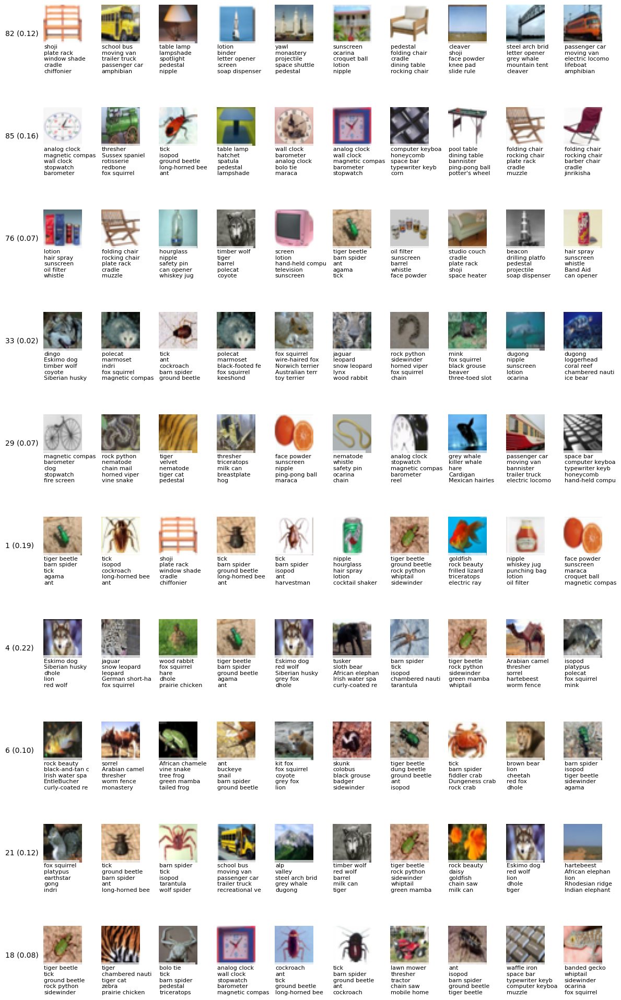

---feature 1: 0.19---
---feature 2: 0.01---
---feature 4: 0.22---
---feature 6: 0.10---
---feature 7: 0.40---
---feature 9: 0.41---
---feature 10: 0.49---
---feature 11: 0.14---
---feature 12: 0.33---
---feature 13: 0.02---
---feature 14: 0.20---
---feature 15: 0.59---
---feature 18: 0.08---
---feature 19: 0.06---
---feature 21: 0.12---
---feature 24: 0.26---
---feature 26: 0.06---
---feature 28: 0.11---
---feature 29: 0.07---
---feature 31: 0.09---
---feature 33: 0.02---
---feature 34: 0.06---
---feature 35: 0.03---
---feature 37: 0.62---
---feature 39: 0.22---
---feature 40: 0.19---
---feature 43: 0.03---
---feature 44: 0.37---
---feature 45: 0.04---
---feature 47: 0.04---
---feature 48: 0.11---
---feature 51: 0.03---
---feature 53: 0.06---
---feature 55: 0.21---
---feature 56: 0.08---
---feature 58: 0.11---
---feature 59: 0.10---
---feature 60: 0.31---
---feature 61: 0.34---
---feature 66: 0.26---
---feature 67: 0.42---
---feature 69: 0.04---
---feature 70: 0.02---
---feature 75: 0.

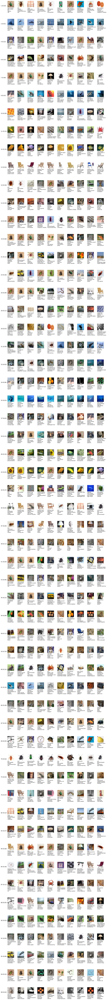

In [ ]:
import matplotlib.pyplot as plt
import torchvision.transforms as transforms

def plot_top_images(circuit_idxs, file):
    topk = 10
    transform = transforms.Compose([
        transforms.Resize(224),  # Resize to 224x224
        transforms.Normalize(    # Normalize with ImageNet's mean and std
            mean=[0.485, 0.456, 0.406], 
            std=[0.229, 0.224, 0.225]
        ),
    ])

    eigenmodel.model.eval()

    # Count active features
    active_features = [i for i in circuit_idxs if frac_activated[i] >= 0.01]

    # Create one long subplot
    fig, axes = plt.subplots(len(active_features), topk, figsize=(1.2*topk, len(active_features)*2))
    # flatten axes

    for row_idx, i in enumerate(active_features):
        print(f'---feature {i}: {frac_activated[i]:.2f}---')
        top_circuit_vals = abs(circuit_vals[:, i]).topk(topk).indices
        top_images = X_ordered[top_circuit_vals]

        for image_idx in range(topk):
            ax = axes[row_idx, image_idx]
            P = eigenmodel.model(transform(top_images[image_idx].to('cuda').unsqueeze(0)))[0].softmax(dim=-1)
            jac = compute_jacobian(eigenmodel, transform(top_images[image_idx].to('cuda')), i, device='cuda', has_token_dim=False)

            # Show image
            ax.imshow(top_images[image_idx].permute(1, 2, 0).detach().cpu().numpy())
            ax.axis('off')

            # Annotate with top class predictions
            top_labels = '\n'.join([imagenet_classes[c][:15] for c in abs(jac).argsort(descending=True)[:5].tolist()])
            ax.text(0, 32, top_labels, ha='left', va='top', fontsize=8, bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

        # Add feature labels to the left of each row
        axes[row_idx,0].text(-32, 25,
                            f'{i} ({frac_activated[i]:.2f})', fontsize=10)

    plt.tight_layout()
    plt.savefig(file, transparent=True, bbox_inches='tight')
    plt.show()
    

plot_top_images([2, 12, 13, 35, 43, 48,  56, 66, 70, 94], figure_names.fav_circuits_cnn)


plot_top_images(list(range(100)), figure_names.all_circuits_cnn)

# Put a horizontal line above each row


---feature 2: 0.01---


/root/.eigenestimation/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


---feature 13: 0.02---
---feature 35: 0.03---
---feature 40: 0.19---
---feature 43: 0.03---
---feature 48: 0.11---
---feature 56: 0.08---
---feature 70: 0.02---
---feature 94: 0.22---
---feature 98: 0.02---


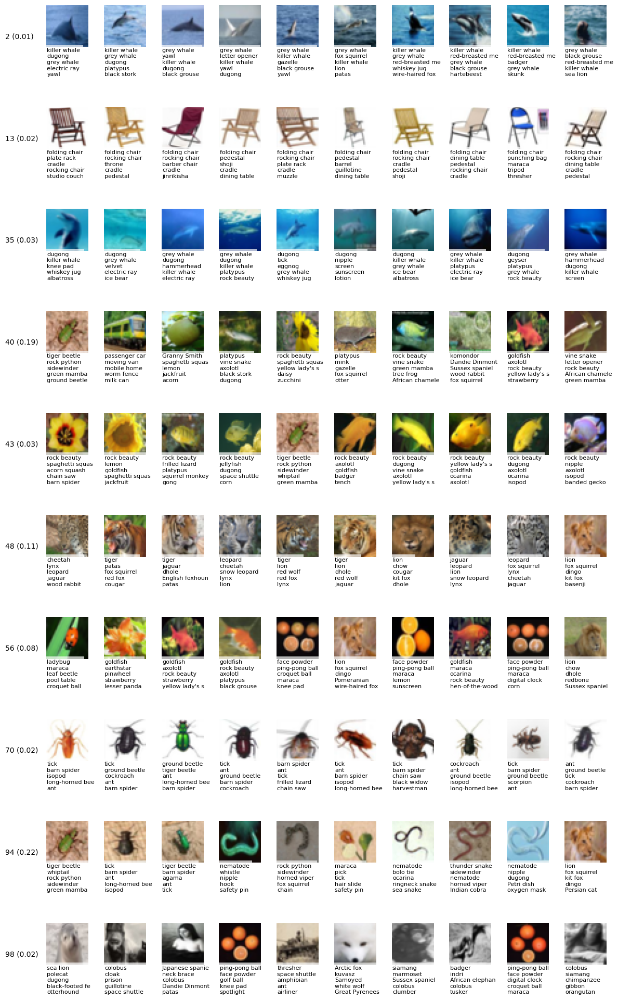

In [6]:
plot_top_images([2, 13, 35, 40, 43, 48,  56, 70, 94, 98], figure_names.fav_circuits_cnn)

In [7]:
figure_names.fav_circuits_cnn

'/root/eigenestimation/figures/favorite_cnn_circuits'

In [ ]:
from functorch.experimental import replace_all_batch_norm_modules_
P = eigenmodel.model(top_images[image_idx].to('cuda').unsqueeze(0))[0]

Using cache found in /root/.cache/torch/hub/pytorch_vision_main


['space bar',
 'typewriter keyboard',
 'computer keyboard',
 'combination lock',
 'abacus',
 'chime',
 'accordion',
 'oil filter',
 'hand-held computer',
 'pick']

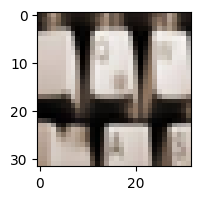

In [11]:
import torch
import torchvision.transforms as transforms
from functorch.experimental import replace_all_batch_norm_modules_

# Load the pretrained model (works for CIFAR-100 as well)
model = torchvision.models.mobilenet_v3_small(pretrained=True).to('cuda')
model.eval()  # Set to evaluation mode

import torch
import torch.nn as nn

import torch
import torch.nn as nn

def replace_bn_with_gn(model):
    for name, module in model.named_children():
        if isinstance(module, nn.BatchNorm2d):
            setattr(model, name, nn.GroupNorm(num_groups=32, num_channels=module.num_features))
        else:
            replace_bn_with_gn(module)


# Replace BatchNorm with GroupNorm
eigenmodel.model.eval()
# Apply fix to the model
#replace_bn_with_no_mutation_bn(model)
model.to('cuda')
model.eval()
#replace_all_batch_norm_modules_(model)
idx = 15
plt.figure(figsize=(2, 2))
plt.imshow((X_ordered[idx]).permute(1, 2, 0).detach().cpu().numpy())
preds = eigenmodel.model(transform(X_ordered[idx]).unsqueeze(0).to('cuda')).argsort(descending=True)[0,:10]
[imagenet_classes[p] for p in preds]

In [113]:
transform = transforms.Compose([
    transforms.Resize(224),           # Resize to 224x224
    transforms.Normalize(             # Normalize with ImageNet's mean and std
        mean=[0.485, 0.456, 0.406],   # ImageNet mean for RGB
        std=[0.229, 0.224, 0.225]     # ImageNet std for RGB
    ),
])

In [169]:
for name, param in model.named_parameters():
    print(name, param.shape)


conv1.weight torch.Size([64, 3, 7, 7])
bn1.weight torch.Size([64])
bn1.bias torch.Size([64])
layer1.0.conv1.weight torch.Size([64, 64, 3, 3])
layer1.0.bn1.weight torch.Size([64])
layer1.0.bn1.bias torch.Size([64])
layer1.0.conv2.weight torch.Size([64, 64, 3, 3])
layer1.0.bn2.weight torch.Size([64])
layer1.0.bn2.bias torch.Size([64])
layer1.1.conv1.weight torch.Size([64, 64, 3, 3])
layer1.1.bn1.weight torch.Size([64])
layer1.1.bn1.bias torch.Size([64])
layer1.1.conv2.weight torch.Size([64, 64, 3, 3])
layer1.1.bn2.weight torch.Size([64])
layer1.1.bn2.bias torch.Size([64])
layer2.0.conv1.weight torch.Size([128, 64, 3, 3])
layer2.0.bn1.weight torch.Size([128])
layer2.0.bn1.bias torch.Size([128])
layer2.0.conv2.weight torch.Size([128, 128, 3, 3])
layer2.0.bn2.weight torch.Size([128])
layer2.0.bn2.bias torch.Size([128])
layer2.0.downsample.0.weight torch.Size([128, 64, 1, 1])
layer2.0.downsample.1.weight torch.Size([128])
layer2.0.downsample.1.bias torch.Size([128])
layer2.1.conv1.weight tor

In [153]:
model(transform(X_ordered[idx]).unsqueeze(0).to('cuda')).argsort(descending=True)[:,:10]

tensor([[183, 335, 269, 272, 331, 190, 408,  51, 252, 350]], device='cuda:0')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.415788..1.7180408].


['wall clock',
 'analog clock',
 'gong',
 'magnetic compass',
 'maraca',
 'chime',
 'barometer',
 'space bar',
 'pick',
 'drum']

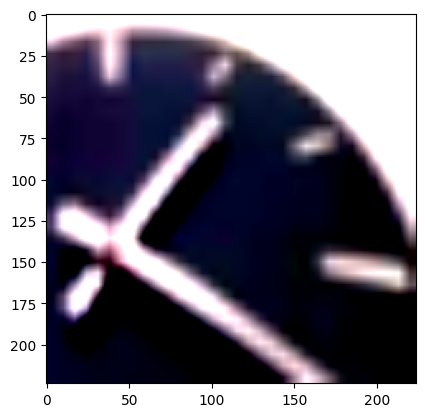

In [104]:
from torchvision.models import vgg11

model = vgg11().to('cuda')
model.features[0] = torch.nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1).to('cuda')
model.avgpool = torch.nn.Identity().to('cuda')

'bulletproof vest'

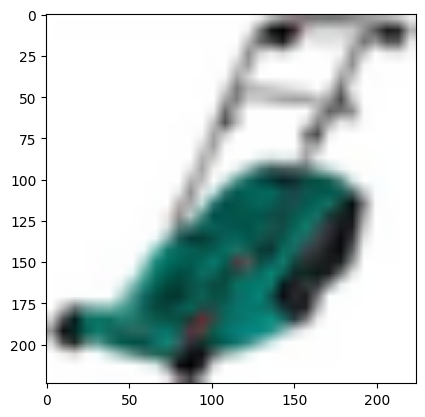

In [12]:
figure_names.top_images_eigenmodel = '/root/eigenestimation/figures/poster/poster_top_images_feature_%i.svg'

---feature 82: 0.08---


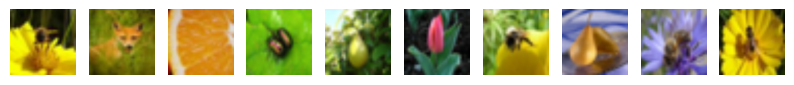

---feature 85: 0.16---


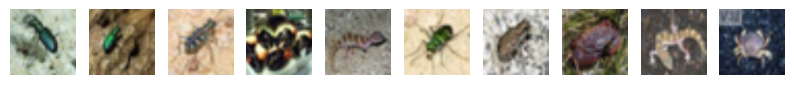

---feature 81: 0.10---


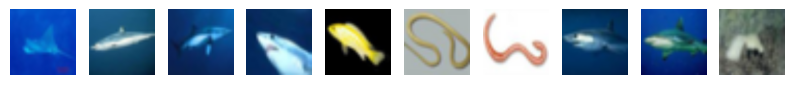

---feature 99: 0.06---


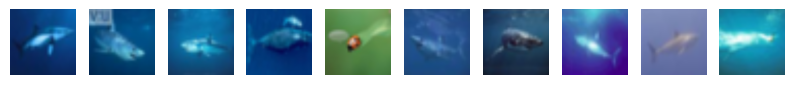

---feature 76: 0.18---


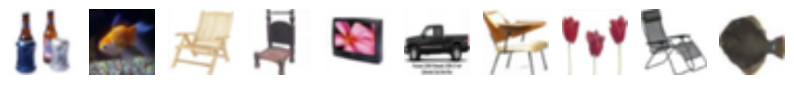

---feature 50: 0.20---


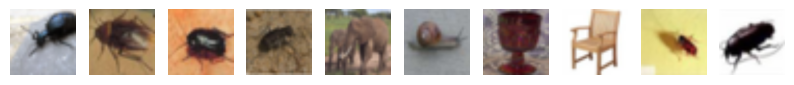

---feature 33: 0.09---


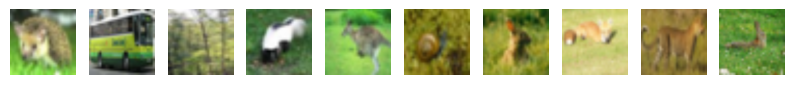

---feature 29: 0.08---


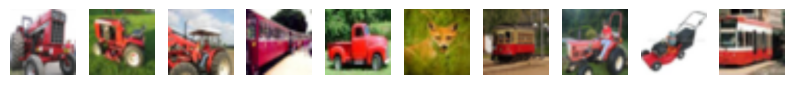

---feature 1: 0.13---


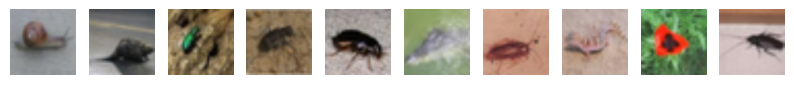

---feature 4: 0.06---


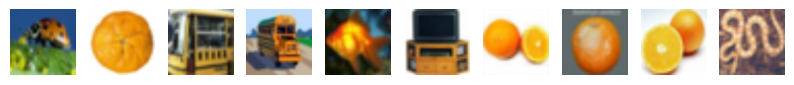

---feature 6: 0.08---


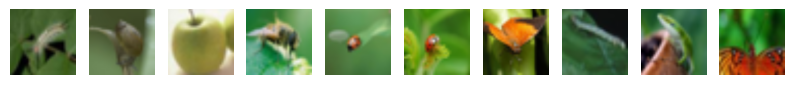

---feature 21: 0.14---


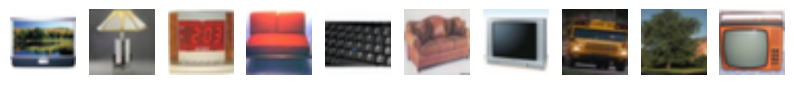

---feature 18: 0.13---


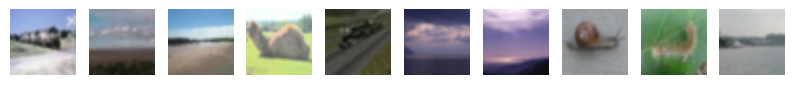

In [13]:
import matplotlib.pyplot as plt
topk = 10
interesting_features = [82, 85, 81, 99, 76, 50, 33, 29, 1, 4, 6, 21, 18]
for i in interesting_features:
    print(f'---feature {i}: {frac_activated[i]:.2f}---')
    top_circuit_vals = abs(circuit_vals[:,i]).topk(topk).indices
    top_images = X_ordered[top_circuit_vals]
    if frac_activated[i] < .01: continue

    # Plot top_images as subplots
    fig, axes = plt.subplots(1, topk, figsize=(1*topk, 1))
    for image_idx, ax in enumerate(axes.flatten()):

        ax.imshow(top_images[image_idx].permute(1, 2, 0).detach().cpu().numpy())
        ax.axis('off')
    fig.savefig(figure_names.top_images_eigenmodel % i, transparent=True, bbox_inches='tight')
    plt.show()
